1. Importar las bibliotecas necesarias 
2. Cargar el conjunto de datos 
3. Explorar la información del conjunto de datos (variables, tipos, cantidad, definiciones, etc)
4. Visualizar la distribución de las variables
5. Explorar la relación entre las variables 
6. Arreglar valores nulos y outliers 
7. Codificar las variables no numéricas 
8. Estandarizar (o normalizar) las variables en las que sea necesario

## 1. Importar las bibliotecas necesarias 

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 2. Cargar el conjunto de datos 

In [3]:
url = 'C:/Users/David/Desktop/upgrade_python/temario_bootcamp/Modulo2/Ejercicios/9.2-Exploratory_Data_Analysys/EDA-Classification/spotify-2023.csv'

spotify2023 = pd.read_csv(url, encoding='ISO-8859-1')

In [4]:
spotify2023.head()

,track_name,artist(s)_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,147,141381703,43,...,125,B,Major,80,89,83,31,0,8,4
1,LALA,Myke Towers,1,2023,3,23,1474,48,133716286,48,...,92,C#,Major,71,61,74,7,0,10,4
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,113,140003974,94,...,138,F,Major,51,32,53,17,0,31,6
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,100,800840817,116,...,170,A,Major,55,58,72,11,0,11,15
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,50,303236322,84,...,144,A,Minor,65,23,80,14,63,11,6


## 3. Explorar la información del conjunto de datos (variables, tipos, cantidad, definiciones, etc)

In [5]:
spotify2023.rename(columns={'artist(s)_name':"artists_name"}, inplace=True)

In [6]:
spotify2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   track_name            953 non-null    object
 1   artists_name          953 non-null    object
 2   artist_count          953 non-null    int64 
 3   released_year         953 non-null    int64 
 4   released_month        953 non-null    int64 
 5   released_day          953 non-null    int64 
 6   in_spotify_playlists  953 non-null    int64 
 7   in_spotify_charts     953 non-null    int64 
 8   streams               953 non-null    object
 9   in_apple_playlists    953 non-null    int64 
 10  in_apple_charts       953 non-null    int64 
 11  in_deezer_playlists   953 non-null    object
 12  in_deezer_charts      953 non-null    int64 
 13  in_shazam_charts      903 non-null    object
 14  bpm                   953 non-null    int64 
 15  key                   858 non-null    ob

In [7]:
spotify2023.describe().T

,count,mean,std,min,25%,50%,75%,max
artist_count,953.0,1.556139,0.893044,1.0,1.0,1.0,2.0,8.0
released_year,953.0,2018.238195,11.116218,1930.0,2020.0,2022.0,2022.0,2023.0
released_month,953.0,6.033578,3.566435,1.0,3.0,6.0,9.0,12.0
released_day,953.0,13.930745,9.201949,1.0,6.0,13.0,22.0,31.0
in_spotify_playlists,953.0,5200.124869,7897.608990,31.0,875.0,2224.0,5542.0,52898.0
in_spotify_charts,953.0,12.009444,19.575992,0.0,0.0,3.0,16.0,147.0
in_apple_playlists,953.0,67.812172,86.441493,0.0,13.0,34.0,88.0,672.0
in_apple_charts,953.0,51.908709,50.630241,0.0,7.0,38.0,87.0,275.0
in_deezer_charts,953.0,2.666317,6.035599,0.0,0.0,0.0,2.0,58.0
bpm,953.0,122.540399,28.057802,65.0,100.0,121.0,140.0,206.0


In [8]:
null_values = spotify2023.isnull().sum()
print(f"Hay un total de {null_values.sum()} valores nulos")
print(null_values[null_values>0])

Hay un total de 145 valores nulos
in_shazam_charts    50
key                 95
dtype: int64


## 4. Visualización de la Distribución de Variables

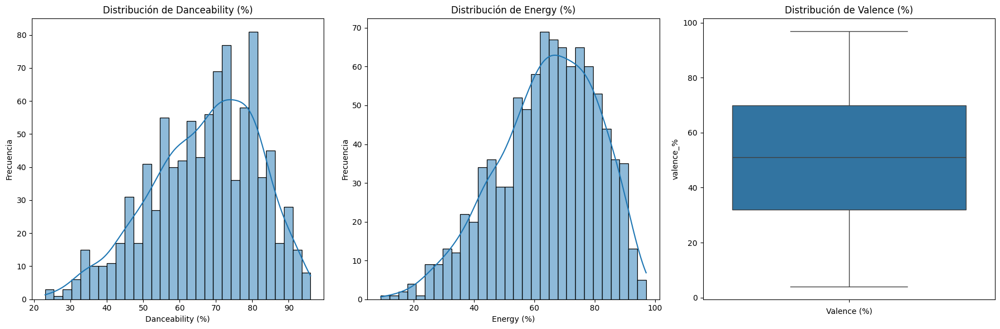

In [9]:
plt.figure(figsize=(18, 6))

# Histograma para 'danceability_%'
plt.subplot(1, 3, 1)
sns.histplot(spotify2023['danceability_%'], kde=True, bins=30)
plt.title('Distribución de Danceability (%)')
plt.xlabel('Danceability (%)')
plt.ylabel('Frecuencia')

# Histograma para 'energy_%'
plt.subplot(1, 3, 2)
sns.histplot(spotify2023['energy_%'], kde=True, bins=30)
plt.title('Distribución de Energy (%)')
plt.xlabel('Energy (%)')
plt.ylabel('Frecuencia')

# Diagrama de caja para 'valence_%' (positividad musical)
plt.subplot(1, 3, 3)
sns.boxplot(y=spotify2023['valence_%'])
plt.title('Distribución de Valence (%)')
plt.xlabel('Valence (%)')

# Ajustar el layout y mostrar la figura
plt.tight_layout()
plt.show()




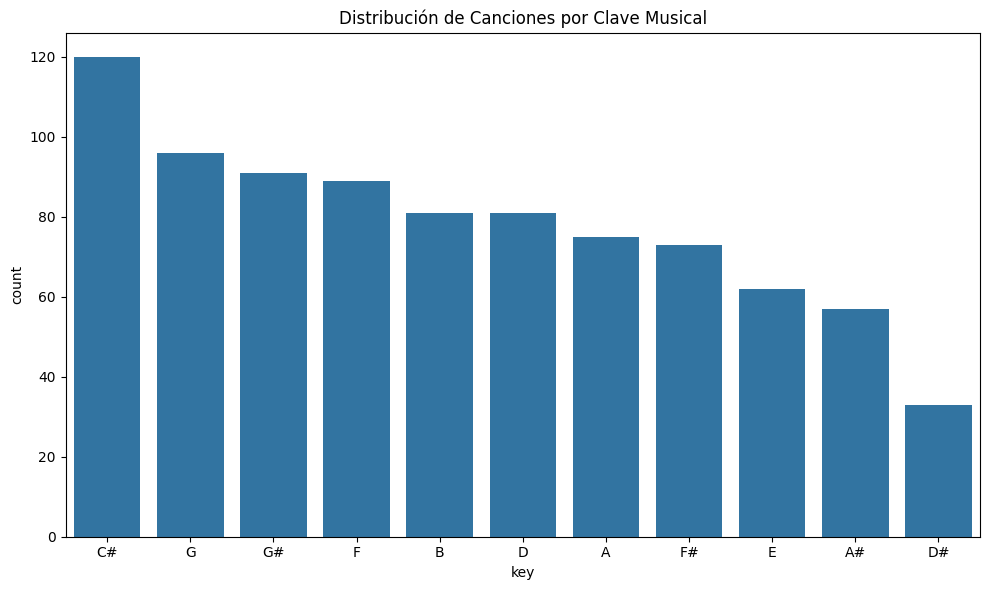

In [10]:
# Diagrama de Barras para 'key'
plt.figure(figsize=(10, 6))
sns.countplot(x='key', data=spotify2023, order = spotify2023['key'].value_counts().index)
plt.title('Distribución de Canciones por Clave Musical')
plt

plt.tight_layout()
plt.show()

In [11]:
#Observamos los valores que toma la variable
list(set(spotify2023['key']))

['A', 'G', 'E', nan, 'D#', 'B', 'D', 'A#', 'F', 'G#', 'C#', 'F#']

Eliminamos los símbolos #

In [12]:
spotify2023.loc[:,'key'] = spotify2023.loc[:,'key'].str.replace('#', '')

Codificamos la variable

In [13]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder().fit(spotify2023[['key']])
enc_data = pd.DataFrame(encoder.transform(spotify2023[['key']]).toarray(), columns = encoder.categories_[0].tolist())
data = pd.concat([spotify2023, enc_data], axis = 1)
data = data.drop(['key'], axis = 1)

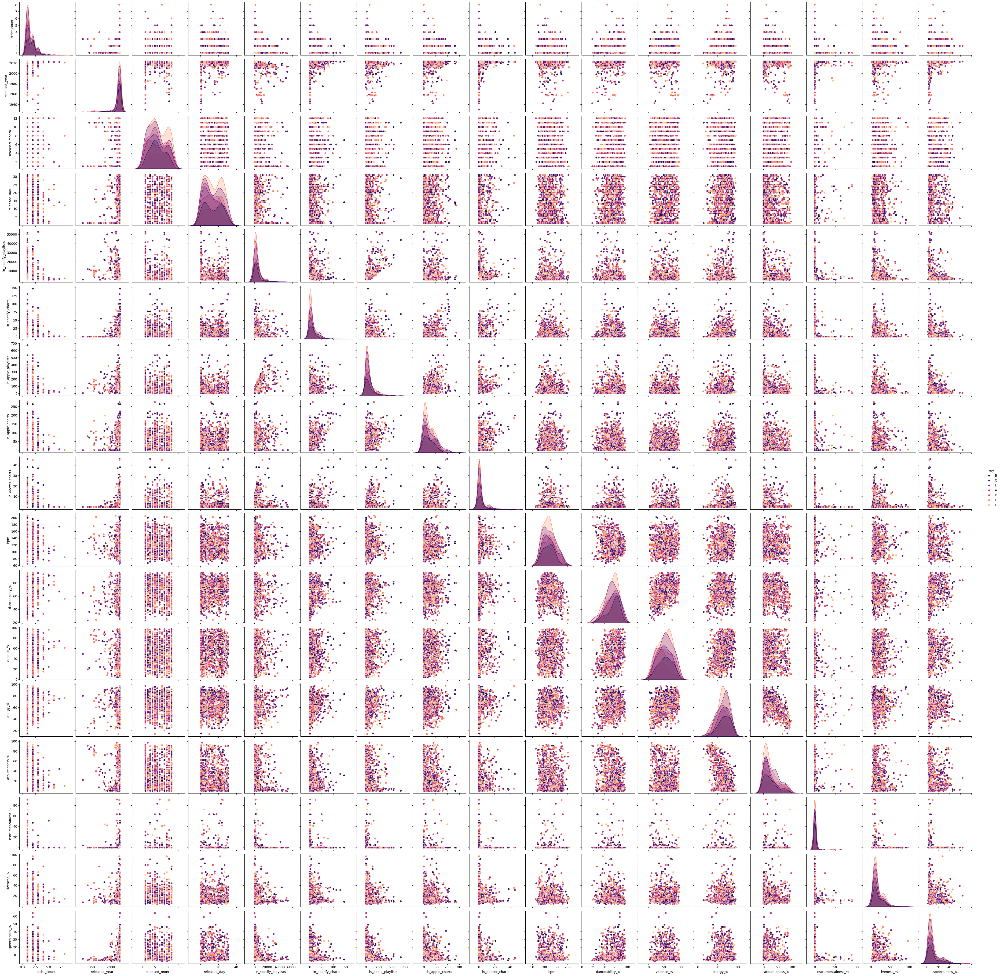

In [14]:
sns.pairplot(spotify2023, diag_kind='kde', hue='key', palette='magma')

## 5. Explorar la relación entre las variables 

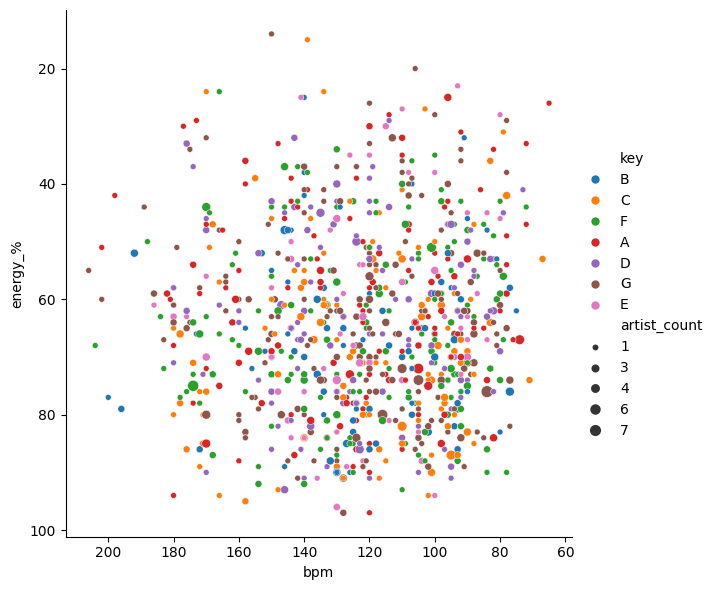

In [15]:
g = sns.relplot(data=spotify2023, x='bpm', y='energy_%', hue='key', size='artist_count', height=6)
g.fig.axes[0].invert_yaxis()
g.fig.axes[0].invert_xaxis()
plt.show()


C:\Users\David\AppData\Local\Temp\ipykernel_28048\2911022087.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = spotify2023.corr()


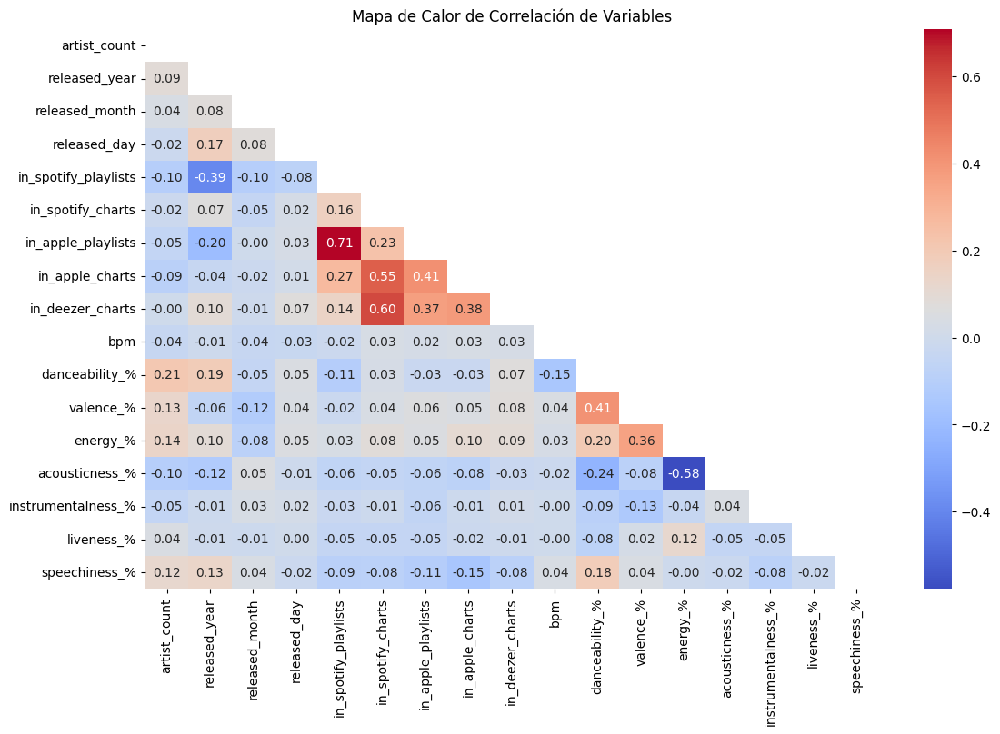

In [16]:
correlation = spotify2023.corr()

mask = np.triu(np.ones_like(correlation, dtype=bool))

plt.figure(figsize=(13, 8))

sns.heatmap(correlation, mask=mask, annot=True, fmt=".2f", cmap='coolwarm')

plt.title('Mapa de Calor de Correlación de Variables')

plt.show()


## 6. Arreglar valores nulos y outliers 

In [17]:
null_values = spotify2023.isnull().sum()
print(null_values[null_values>0])

in_shazam_charts    50
key                 95
dtype: int64


In [18]:
# Tratamiento de valores nulos para 'key'
key_mode = spotify2023['key'].mode()[0]
spotify2023['key'].fillna(key_mode, inplace=True)

# Tratamiento de valores nulos para 'in_shazam_charts'
spotify2023['in_shazam_charts'].fillna(0, inplace=True)


In [19]:
null_values = spotify2023.isnull().sum()
print(null_values[null_values>0])

Series([], dtype: int64)


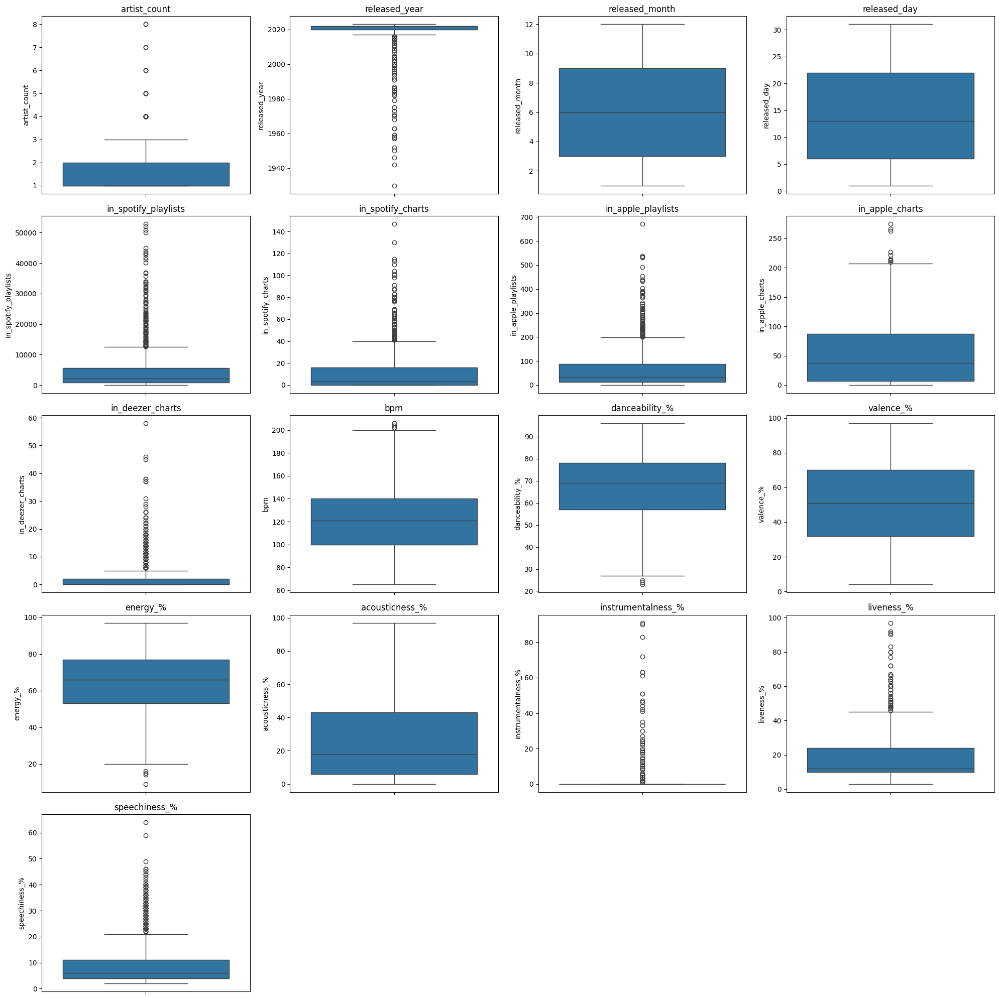

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definimos variables numéricas
numeric_vars = spotify2023.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Configuraremos el tamaño de la figura para acomodar múltiples subplots
rows = (len(numeric_vars) + 3) // 4  # Calcular el número de filas necesarias para 4 columnas
plt.figure(figsize=(20, rows * 4))  # La altura de cada fila es 4

# Creamos un boxplot para cada variable numérica
for i, col in enumerate(numeric_vars):
    plt.subplot(rows, 4, i+1)
    sns.boxplot(y=spotify2023[col])
    plt.title(col)

plt.tight_layout()

plt.show()


In [21]:
# Definiremos una función para tratar los valores atípicos en el conjunto de datos.
# Reemplazaremos los valores atípicos con la mediana del conjunto de datos.
def replace_outliers_with_median(df, columns):
    """
    Reemplaza los valores atípicos con la mediana de la columna.
    Los valores atípicos se identifican como aquellos que se encuentran fuera de 1.5 veces el rango intercuartílico (IQR) por encima del tercer cuartil o por debajo del primer cuartil.
    """
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        median_value = df[col].median()
        df.loc[outliers.index, col] = median_value

# Lista de columnas con valores atípicos a corregir
outlier_columns = [
    'speechiness_%', 'instrumentalness_%', 'liveness_%', 'bpm', 
    'danceability_%', 'in_deezer_charts', 'in_spotify_playlists', 
    'in_spotify_charts', 'in_apple_playlists', 'in_apple_charts'
]

# Aplicar la función al conjunto de datos
replace_outliers_with_median(spotify2023, outlier_columns)


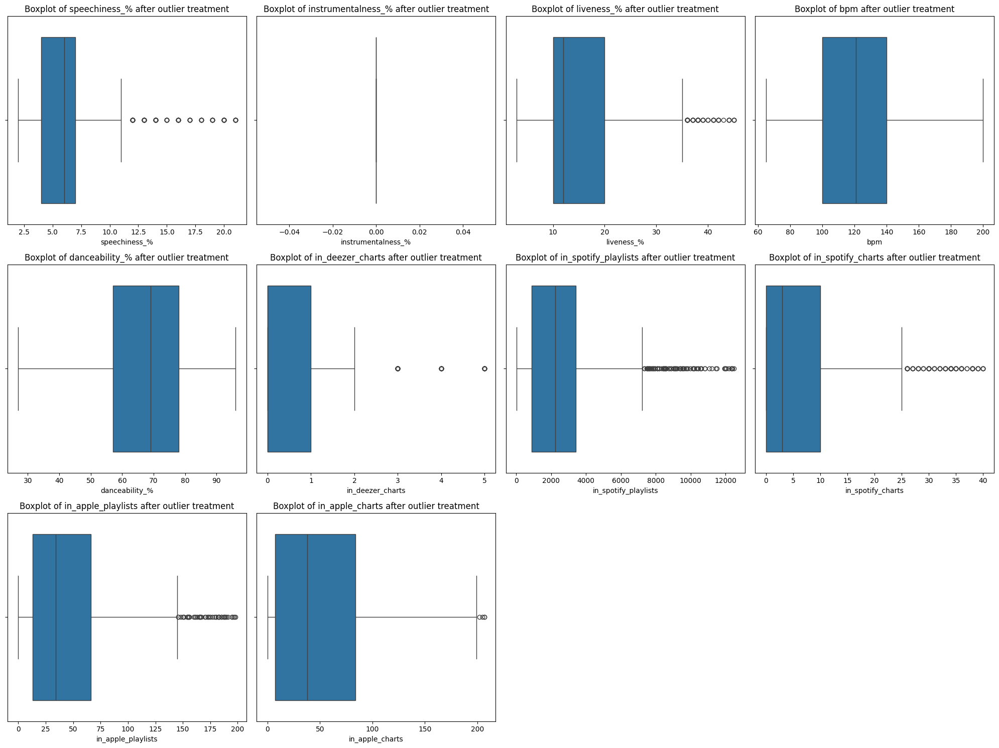

In [22]:
# Configuraremos la visualización para mostrar los boxplots después de la corrección de valores atípicos
# Se mostrarán de 4 en 4 variables numéricas por fila

cols_per_row = 4
rows = len(outlier_columns) // cols_per_row + (1 if len(outlier_columns) % cols_per_row else 0)

plt.figure(figsize=(20, rows * 5))

for index, col in enumerate(outlier_columns, 1):
    plt.subplot(rows, cols_per_row, index)
    sns.boxplot(x=spotify2023[col])
    plt.title(f'Boxplot of {col} after outlier treatment')

plt.tight_layout()
plt.show()


## 7. Codificar las variables no numéricas 

In [23]:
# Identificando las columnas no numéricas en el conjunto de datos
non_numeric_columns = spotify2023.select_dtypes(include=['object']).columns.tolist()

non_numeric_columns


['track_name',
 'artists_name',
 'streams',
 'in_deezer_playlists',
 'in_shazam_charts',
 'key',
 'mode']

In [24]:
# Verificando los tipos de datos de las columnas 'streams', 'in_deezer_playlists', y 'in_shazam_charts'
data_types = spotify2023[['streams', 'in_deezer_playlists', 'in_shazam_charts']].dtypes

data_types


streams                object
in_deezer_playlists    object
in_shazam_charts       object
dtype: object

In [25]:
# Convirtiendo 'streams', 'in_deezer_playlists', y 'in_shazam_charts' a numéricas
spotify2023['streams'] = pd.to_numeric(spotify2023['streams'], errors='coerce')
spotify2023['in_deezer_playlists'] = pd.to_numeric(spotify2023['in_deezer_playlists'], errors='coerce')
spotify2023['in_shazam_charts'] = pd.to_numeric(spotify2023['in_shazam_charts'], errors='coerce')

# Aplicando la codificación One-Hot a 'key' y 'mode'
spotify2023_encoded = pd.get_dummies(spotify2023, columns=['key', 'mode'])

spotify2023_encoded.head()


,track_name,artists_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,speechiness_%,key_A,key_B,key_C,key_D,key_E,key_F,key_G,mode_Major,mode_Minor
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",2,2023,7,14,553,3,141381703.0,43,...,4,0,1,0,0,0,0,0,1,0
1,LALA,Myke Towers,1,2023,3,23,1474,3,133716286.0,48,...,4,0,0,1,0,0,0,0,1,0
2,vampire,Olivia Rodrigo,1,2023,6,30,1397,3,140003974.0,94,...,6,0,0,0,0,0,1,0,1,0
3,Cruel Summer,Taylor Swift,1,2019,8,23,7858,3,800840817.0,116,...,15,1,0,0,0,0,0,0,1,0
4,WHERE SHE GOES,Bad Bunny,1,2023,5,18,3133,3,303236322.0,84,...,6,1,0,0,0,0,0,0,0,1


## 8. Estandarizar (o normalizar) las variables en las que sea necesario

In [26]:
from sklearn.preprocessing import StandardScaler

# Identificando las variables numéricas continuas
numeric_cols = spotify2023.select_dtypes(include=['int64', 'float64']).columns

# Inicializando el StandardScaler
scaler = StandardScaler()

# Estandarizando las variables numéricas continuas
spotify2023_scaled = spotify2023.copy()
spotify2023_scaled[numeric_cols] = scaler.fit_transform(spotify2023[numeric_cols])

spotify2023_scaled.head()


,track_name,artists_name,artist_count,released_year,released_month,released_day,in_spotify_playlists,in_spotify_charts,streams,in_apple_playlists,...,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,Seven (feat. Latto) (Explicit Ver.),"Latto, Jung Kook",0.497282,0.428590,0.271119,0.007530,-0.838324,-0.395724,-0.657929,-0.071679,...,0.105614,B,Major,0.893657,1.600828,1.131729,0.151729,0.0,-0.837120,-0.657124
1,LALA,Myke Towers,-0.623072,0.428590,-0.851038,0.986097,-0.485100,-0.395724,-0.671459,0.038891,...,-1.098248,C,Major,0.269632,0.407730,0.587654,-0.771972,0.0,-0.626236,-0.657124
2,vampire,Olivia Rodrigo,-0.623072,0.428590,-0.009420,1.747205,-0.514631,-0.395724,-0.660361,1.056133,...,0.579863,F,Major,-1.117090,-0.827979,-0.681854,-0.387097,0.0,1.588050,-0.131094
3,Cruel Summer,Taylor Swift,-0.623072,0.068567,0.551659,0.986097,1.963303,-0.395724,0.506043,1.542640,...,1.747244,A,Major,-0.839745,0.279898,0.466749,-0.618022,0.0,-0.520794,2.236044
4,WHERE SHE GOES,Bad Bunny,-0.623072,0.428590,-0.289959,0.442449,0.151163,-0.395724,-0.372249,0.834993,...,0.798747,A,Minor,-0.146384,-1.211475,0.950371,-0.502559,0.0,-0.520794,-0.131094
